# ex17. 도로의 레이블 정보를 활용해 이미지 생성하기 / Pix2Pix 
- color segmented image 생성하기 
***
### Image-to-Image Translation with Conditional Adversarial Nets(2017, CVPR)
- image to image translation: 이미지 데이터 셋을 사용하여 input 이미지와 output 이미지를 mapping 하는 것을 목표로 하는 생성모델의 한 분야(예: 흑백 이미지에 컬러 입히기, 낮 사진을 밤 사진으로 만들기)
- pix2pix:CGAN이라는 조건부 생성모델을 바탕으로 포관적인 작업 수행 
- pix2pix의 generator:noise 입력 없이 이미지만 input으로 받아 output 생성, U-net 구조와 skip connection 사용한게 특징 

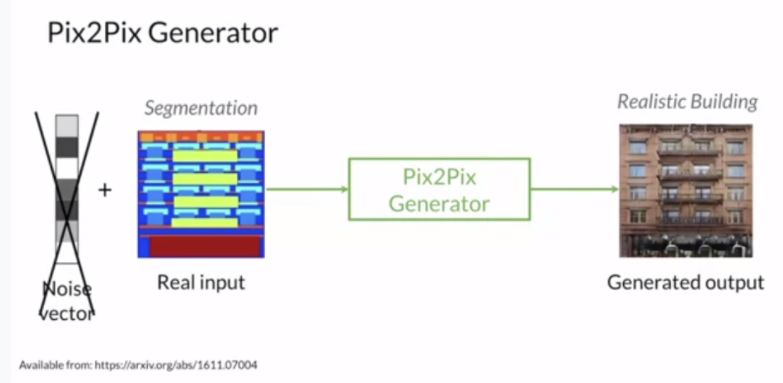

- pix2pix의 discriminator: generator에 넣었던 input이미지 그리고 이와 pair가 되는 진짜 이미지나 생성된 이미지를 input으로 받음, 이 pair 이미지를 비교하여 진짜인지 가까인지 판별, patchgan 사용한게 특징

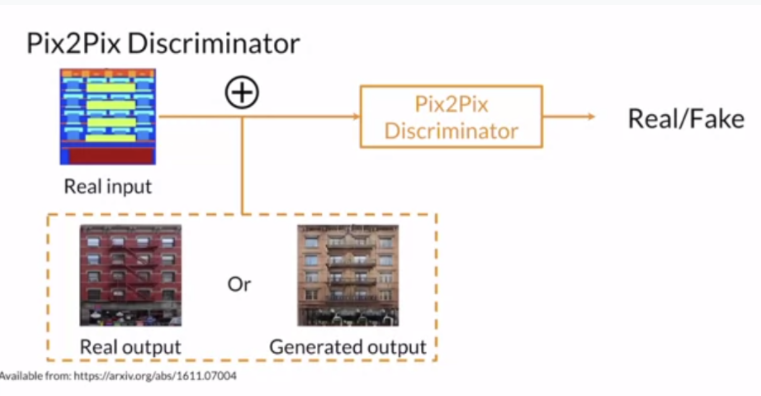

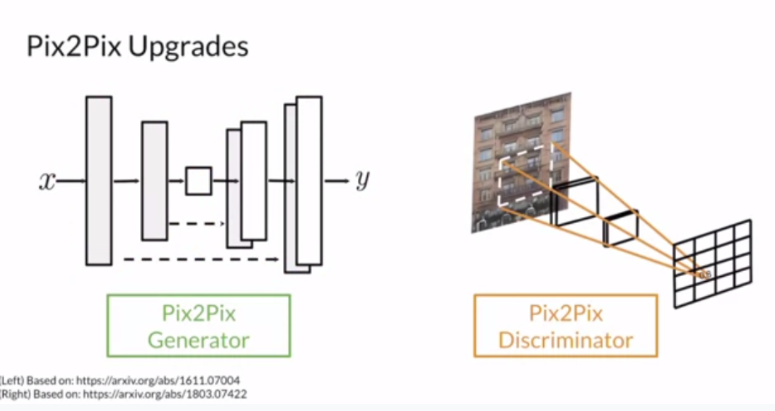

[Reference](https://velog.io/@tobigs-gm1/Image-to-Image-Translation)

In [5]:
import tensorflow as tf
import cv2
import os
import time
import numpy as np
from matplotlib import pyplot as plt
from IPython import display

In [6]:
! pip install -q -U tensorboard #tensorboard 설치 

### Loading data

In [7]:
from google.colab import drive #드라이브 마운틴 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
!unzip -qq "/content/drive/MyDrive/pix2pix/cityscapes.zip" #압축풀기 

In [9]:
# 경로 설정 
train_path = '/content/cityscapes/train/'
val_path = '/content/cityscapes/val/'
print("number of train examples :", len(os.listdir(train_path))) #train 이미지 1000장
print("number of val examples :", len(os.listdir(val_path))) #test 이미지 5장 

number of train examples : 1000
number of val examples : 5


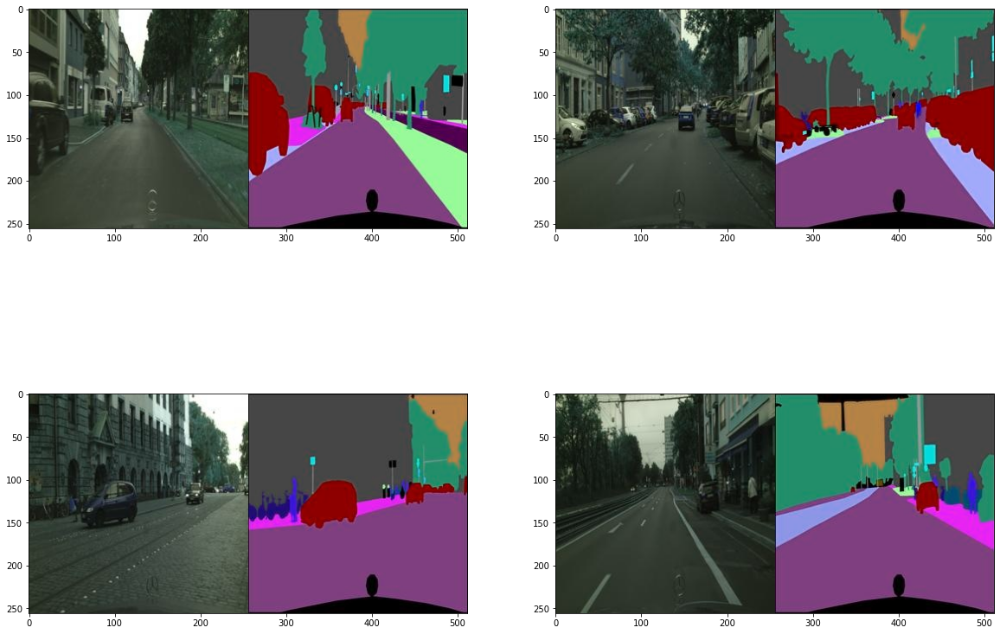

In [10]:
plt.figure(figsize=(20,15))
for i in range(1, 5): #4장 시각화
    f = train_path + os.listdir(train_path)[np.random.randint(1000)] #임의의 숫자 확인 
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(2,2,i)
    plt.imshow(img)

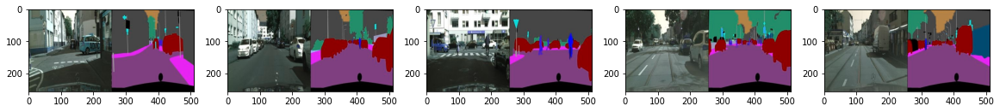

In [11]:
#validation data 사진 확인 
plt.figure(figsize=(20,15))
for i in range(1, 6): #4장 시각화
    f = val_path + str(i) + '.jpg' #임의의 숫자 확인 
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(1,5,i)
    plt.imshow(img)

In [12]:
f = train_path + os.listdir(train_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape) #train data 크기 확인

(256, 512, 3)


- cityscapes 이미지는 도로 사진과 segmentaion이 처리된 이미지 한쌍으로 구성
- 이미지 크기는 (256, 512, 3) -> 후에 (256, 256, 3) 크기의 이미지 2개로 분할하여 사용 

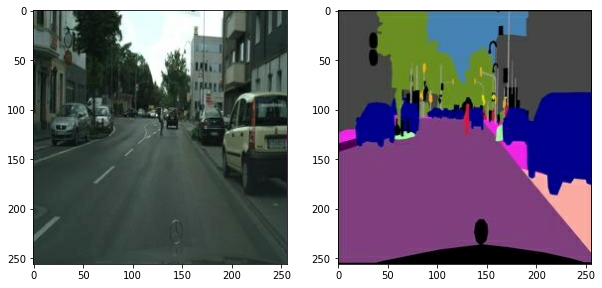

In [13]:
#이미지 2개로 분할 
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1 #normalize [-1, 1]

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2 #이미지 2개로 분할 
    sketch = img[:, :w, :] 
    sketch = tf.cast(sketch, tf.float32)
    colored = img[:, w:, :] 
    colored = tf.cast(colored, tf.float32)
    return normalize(sketch), normalize(colored)

f = train_path + os.listdir(train_path)[1]
street, seg = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(street))
plt.subplot(1,2,2); plt.imshow(denormalize(seg))

### Augmentation

In [14]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용 
def apply_augmentation(street, seg):
    stacked = tf.concat([street, seg], axis=-1) #두 이미지 채널축으로 연결 
    
    _pad = tf.constant([[30,30],[30,30],[0,0]]) #30픽셀 만큼 적용 
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT") #reflect padding
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.) #constant padding

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out) # 50% 확률로 좌우반전
    out = image.random_flip_up_down(out) #50% 확률로 상하반전 
    
    if tf.random.uniform(()) < .5: #50%확률로
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree) #이미지 회전 
    
    return out[...,:3], out[...,3:]   


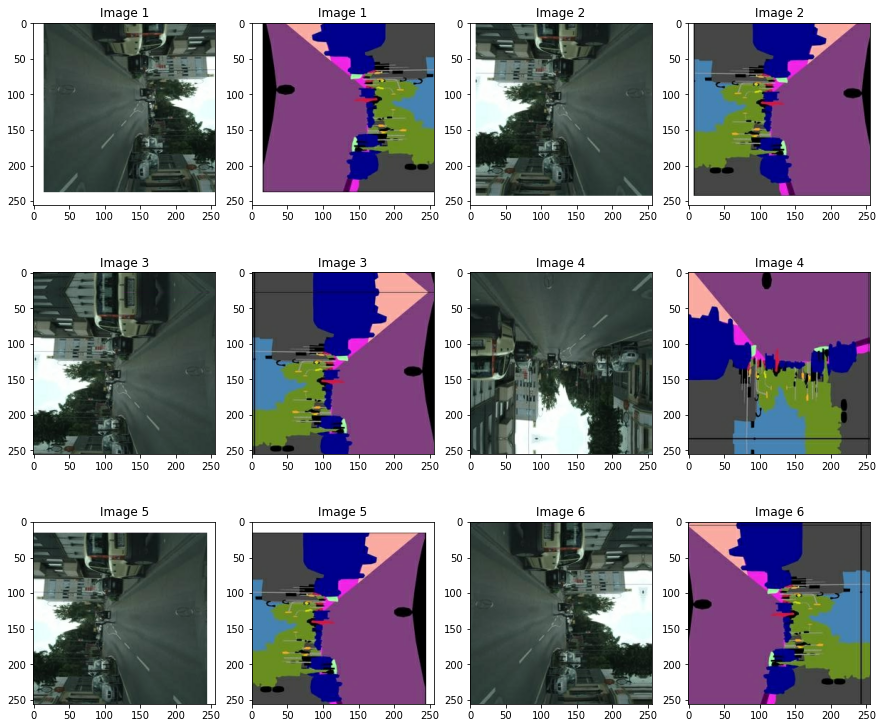

In [15]:
#augmentation 이미지 시각화 
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_street, augmented_seg = apply_augmentation(street, seg)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_street)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_seg)); plt.title(f"Image {img_n}")
    img_n += 1

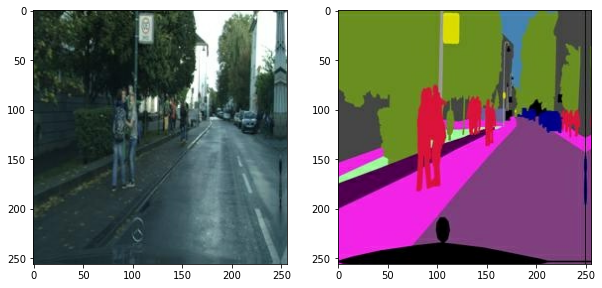

In [16]:
from tensorflow import data

#이미지 2개로 분할 
def get_train(img_path):
    street, seg = load_img(img_path)
    street, seg = apply_augmentation(street, seg)
    return street, seg

train_images = data.Dataset.list_files(train_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
street, seg = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(street[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(seg[0].astype(np.uint8))

### Generator 구현

In [17]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer): #encoderblock 생성
    def __init__(self, n_filters, use_bn=True): #n_filters:필터수, use_bn:batchNorm 사용여부 
        super(EncodeBlock, self).__init__() 
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False) #Convolution(필터크기=4, stride=2)
        self.batchnorm = layers.BatchNormalization() #BatchNorm
        self.lrelu= layers.LeakyReLU(0.2) #LeakyReLU, slope coefficient(=0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

class Encoder(layers.Layer): #encoder 생성 
    def __init__(self):
        super(Encoder, self).__init__()
        filters = [64,128,256,512,512,512,512,512] #필터의 개수 저장 
        
        self.blocks = [] #블록 저장 
        for i, f in enumerate(filters):
            if i == 0:
                self.blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.blocks.append(EncodeBlock(f))
    
    def call(self, x): #block을 차례대로 통과 
        for block in self.blocks:
            x = block(x)
        return x
    
    def get_summary(self, input_shape=(256,256,3)): #레이어가 제대로 구성되었는지 확인하기 위한 용도 
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [18]:
Encoder().get_summary() #input (256, 256, 3) -> output (1, 1, 512)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 encode_block (EncodeBlock)  (None, 128, 128, 64)      3072      
                                                                 
 encode_block_1 (EncodeBlock  (None, 64, 64, 128)      131584    
 )                                                               
                                                                 
 encode_block_2 (EncodeBlock  (None, 32, 32, 256)      525312    
 )                                                               
                                                                 
 encode_block_3 (EncodeBlock  (None, 16, 16, 512)      2099200   
 )                                                               
                                                             

In [19]:
class DecodeBlock(layers.Layer): #Decodeblock 구현 
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False) #conv layer 
        self.batchnorm = layers.BatchNormalization() #batchnorm
        self.relu = layers.ReLU() #relu
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

    
class Decoder(layers.Layer): #Decoder 구현 
    def __init__(self):
        super(Decoder, self).__init__()
        filters = [512,512,512,512,256,128,64] #필터개수
        
        self.blocks = [] #블록 저장 
        for i, f in enumerate(filters):
            if i < 3:
                self.blocks.append(DecodeBlock(f)) #처음 세 개의 블록에서만 dropout을 사용 
            else:
                self.blocks.append(DecodeBlock(f, dropout=False))
                
        self.blocks.append(layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)) #3개의 필터를 사용해 출력 
        
    def call(self, x): #블록 실행 
        for block in self.blocks:
            x = block(x)
        return x
            
    def get_summary(self, input_shape=(1,1,512)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [20]:
Decoder().get_summary() # input (1,1,512) -> output (256,256,3) 

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 1, 1, 512)]       0         
                                                                 
 decode_block (DecodeBlock)  (None, 2, 2, 512)         4196352   
                                                                 
 decode_block_1 (DecodeBlock  (None, 4, 4, 512)        4196352   
 )                                                               
                                                                 
 decode_block_2 (DecodeBlock  (None, 8, 8, 512)        4196352   
 )                                                               
                                                                 
 decode_block_3 (DecodeBlock  (None, 16, 16, 512)      4196352   
 )                                                               
                                                           

In [21]:
#tf.keras.Model을 상속받아 Encoder와 Decoder를 연결해 Generator를 구성해보기 
class EncoderDecoderGenerator(Model):
    def __init__(self):
        super(EncoderDecoderGenerator, self).__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
    
    def call(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x
   
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()
        

EncoderDecoderGenerator().get_summary() #4000만개 파라미터 

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 encoder_1 (Encoder)         (None, 1, 1, 512)         19544576  
                                                                 
 decoder_1 (Decoder)         (None, 256, 256, 3)       19542784  
                                                                 
Total params: 39,087,360
Trainable params: 39,076,480
Non-trainable params: 10,880
_________________________________________________________________


In [22]:
# encoder 및 decoder의 기본적인 블록 구현 
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)

class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = [] #encoder block
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = [] #decoder block 
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x): #forward propagation
        features = [] #skip connection 위한 장치
        for block in self.encode_blocks: #encoder 내부 연산 수행 
            x = block(x)
            features.append(x) # 각 block의 출력들을 차례대로 담음
        
        features = features[:-1] # encoder의 마지막 출력은 decoder의 입력으로 직접 입력되므로 skip connection 대상 아님
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat]) #feature 안의 encoder 출력 값들이 거꾸로 decoder의 입력 값으로 들어감 
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

- features[::-1] 필요한 이유
- Skip connection은 Encoder 내 첫 번째 블록의 출력이 Decoder의 마지막 블록에 연결되고, Encoder 내 두 번째 블록의 출력이 Decoder의 뒤에서 2번째 블록에 연결되는.. 등 대칭을 이룸  
- features에는 Encoder 블록들의 출력들이 순서대로 쌓여있고, 이를 Decoder에서 차례대로 사용하기 위해서 features의 역순으로 연결


In [23]:
UNetGenerator().get_summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 encode_block_16 (EncodeBlock)  (None, 128, 128, 64  3072        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 encode_block_17 (EncodeBlock)  (None, 64, 64, 128)  131584      ['encode_block_16[0][0]']        
                                                                                            

### Discriminator 구성 / PatchGAN
- 이미지 조각을 보고 진짜인지 가짜 인지 판별 
- patch 단위로 loss의 역전파 진행 -> detail한 imgae 만들 수 있음
- 대체로 70x70 사이즈 사용, 286x286 사이즈 사용해도 결과물은 70x70과 동일하고 parameter만 증가하기 때문, 학습시간 악영향 

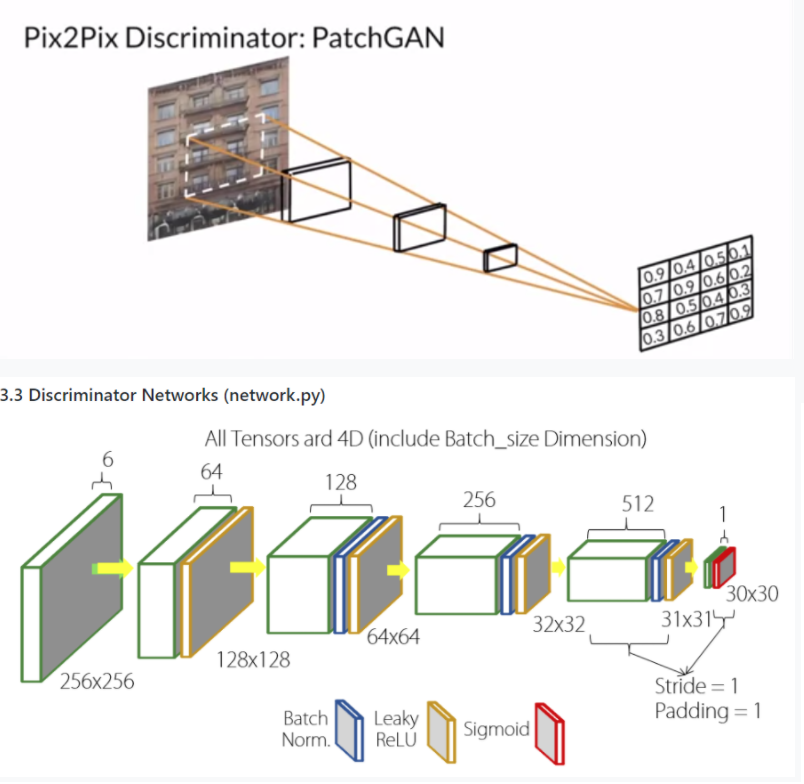

In [24]:
#n_filters(필터의 수), stride(필터 순회 간격), custom_pad:패딩 설정, use_bn:batchNorm 사용여부, act:활성화 함수 사용 여부 
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True): 
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D() #패딩 레이어
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False) #Conv layer
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False) #Conv layer
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None #batchNorm 통과
        self.lrelu = layers.LeakyReLU(0.2) if act else None #LeakyReLU 적용 
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 


In [25]:
inputs = Input((128,128,32))
out = layers.ZeroPadding2D()(inputs)
out = layers.Conv2D(64, 4, 1, "valid", use_bias=False)(out)
out = layers.BatchNormalization()(out)
out = layers.LeakyReLU(0.2)(out)

Model(inputs, out).summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 128, 128, 32)]    0         
                                                                 
 zero_padding2d (ZeroPadding  (None, 130, 130, 32)     0         
 2D)                                                             
                                                                 
 conv2d_24 (Conv2D)          (None, 127, 127, 64)      32768     
                                                                 
 batch_normalization_45 (Bat  (None, 127, 127, 64)     256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 127, 127, 64)      0         
                                                                 
Total params: 33,024
Trainable params: 32,896
Non-trainable

In [26]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")
        
        # filters = [64,128,256,512,1]
        # self.blocks = [layers.Concatenate()]
        # for i, f in enumerate(filters):
        #     self.blocks.append(DiscBlock(
        #         n_filters=f,
        #         strides=2 if i<3 else 1,
        #         custom_pad=False if i<3 else True,
        #         use_bn=False if i==0 and i==4 else True,
        #         act=True if i<4 else False
        #     ))
    
    def call(self, x, y): #총 6개 블록 
        out = self.block1([x, y]) #단순한 연결
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out) #최종 출력 sigmoid 사용 
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()

In [27]:
Discriminator().get_summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_7 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_6[0][0]',                
                                                                  'input_7[0][0]']          

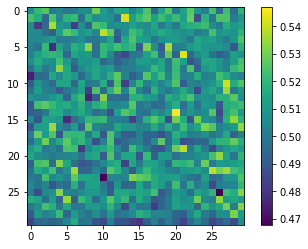

In [28]:
x = tf.random.normal([1,256,256,3]) #(256, 256, 3) 입력
y = tf.random.uniform([1,256,256,3]) #(256, 256, 3) 입력

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar() #(30, 30) 출력, 각 픽셀 값은 sigmoid 함수의 결과 값 0~1 사이의 값을 가짐, 데이터 판별하는데 사용 

### Loss 정의
- generator loss => GAN 손실함수(BinaryCrossentropy) + L1 loss(MeanAbsoluteError)
- discriminator loss => BinaryCrossentropy

In [29]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output) #L1 loss
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc) #GAN 손실함수 
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

### optimizer 정의 /Adam

In [30]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

### 텐서 보드를 위한 작업 


In [31]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer( #주어진 로그 디렉토리에 대한 요약 파일 작성
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

### 모델 학습 준비

In [32]:
import tensorflow as tf

@tf.function
def train_step(street, seg, epoch):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(street, training=True)
        # Discriminator 예측
        fake_disc = discriminator(street, seg, training=True)
        real_disc = discriminator(street, seg, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, seg, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)
                
    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))

    with summary_writer.as_default():
      tf.summary.scalar('gen_total_loss', gene_total_loss, step=epoch) #scaler 형 텐서 사용 
      tf.summary.scalar('gen_gan_loss', gene_loss, step=epoch)
      tf.summary.scalar('gen_l1_loss', l1_loss, step=epoch)
      tf.summary.scalar('disc_loss', disc_loss, step=epoch)
    
    return gene_loss, l1_loss, disc_loss

In [33]:
generator = UNetGenerator()
discriminator = Discriminator()

In [34]:
#체크포인트 경로 지정 
checkpoint_dir = '/content/drive/MyDrive/pix2pix/checkpoint'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer= gene_opt,
                                 discriminator_optimizer=disc_opt,
                                 generator=generator,
                                 discriminator=discriminator)

In [35]:
EPOCHS = 200

def fit(train_images, epochs):
  g_loss_list = []
  l1_loss_list = []
  d_loss_list = []

  for epoch in range(1, EPOCHS+1):
      start = time.time()  
      for i, (street, seg) in enumerate(train_images):
          g_loss, l1_loss, d_loss = train_step(street, seg, epoch) #학습 
          g_loss_list.append(g_loss.numpy())
          l1_loss_list.append(l1_loss.numpy())
          d_loss_list.append(d_loss.numpy())     

          # 10회 반복마다 손실을 출력합니다.
          if (i+1) % 10 == 0:
              print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                      \nGenerator_loss:{g_loss.numpy():.4f} \
                      \nL1_loss:{l1_loss.numpy():.4f} \
                      \nGenerator_Total_Loss:{g_loss.numpy() +(100 * l1_loss.numpy()):4f}\
                      \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")
    
      # saving (checkpoint) the model every 20 epochs
      if (epoch + 1) % 20 == 0:
        checkpoint.save(file_prefix = checkpoint_prefix)

      print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix = checkpoint_prefix)

  return g_loss_list, l1_loss_list, d_loss_list

### 텐서보드를 colab에서 바로 로드 하기
- 텐서보드 extension 로드를 위한 magic command /%load_ext tensorboard
- 텐서보드 로드 / %tensorboard --logdir {log_dir}
[Reference](https://teddylee777.github.io/tensorflow/tensorboard)

In [36]:
#docs_infra: no_execute
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

### 모델 학습 

In [37]:
g_loss_value, l1_loss_value, d_loss_value = fit(train_images, EPOCHS)
g_total_loss = g_loss_value + (100 * l1_loss_value)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Discriminator_loss:1.3863

EPOCH[168] - STEP[40]                       
Generator_loss:0.6915                       
L1_loss:0.0881                       
Generator_Total_Loss:9.503447                      
Discriminator_loss:1.3863

EPOCH[168] - STEP[50]                       
Generator_loss:0.6923                       
L1_loss:0.0730                       
Generator_Total_Loss:7.995034                      
Discriminator_loss:1.3863

EPOCH[168] - STEP[60]                       
Generator_loss:0.6948                       
L1_loss:0.1077                       
Generator_Total_Loss:11.465545                      
Discriminator_loss:1.3863

EPOCH[168] - STEP[70]                       
Generator_loss:0.6924                       
L1_loss:0.0823                       
Generator_Total_Loss:8.925590                      
Discriminator_loss:1.3863

EPOCH[168] - STEP[80]                       
Generator_loss:0.6935                       
L1_loss:0.0809    

### loss 시각화 

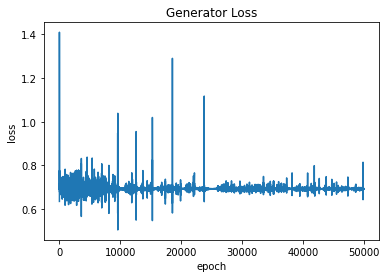

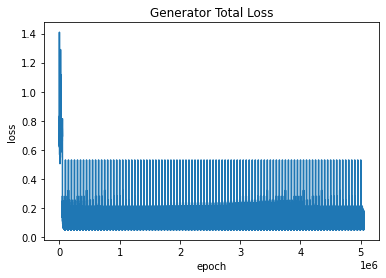

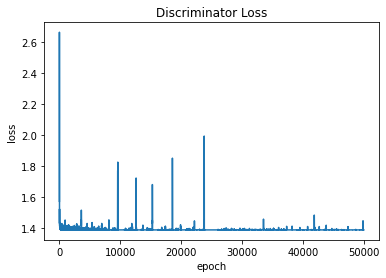

In [38]:
#loss 출력 
import matplotlib.pyplot as plt

plt.plot(g_loss_value)
plt.title('Generator Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

plt.plot(g_total_loss)
plt.title('Generator Total Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

# summarize history for loss
plt.plot(d_loss_value)
plt.title('Discriminator Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.show()

### 결과 확인 

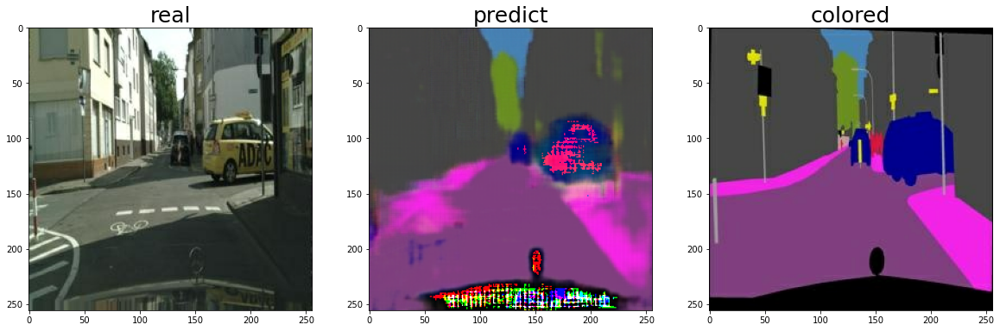

In [39]:
test_ind = 1

f = val_path + os.listdir(val_path)[test_ind]
street, seg = load_img(f)

pred = generator(tf.expand_dims(street, 0))
pred = denormalize(pred)

plt.figure(figsize=(20,10))
plt.subplot(1,3,1); plt.title("real", fontsize=25); plt.imshow(denormalize(street))
plt.subplot(1,3,2); plt.title("predict", fontsize=25); plt.imshow(pred[0])
plt.subplot(1,3,3); plt.title("colored", fontsize=25); plt.imshow(denormalize(seg))

### Restore the lastest checkpoint and test the network 

In [40]:
! ls {checkpoint_dir}

checkpoint		     ckpt-4.index
ckpt-10.data-00000-of-00001  ckpt-5.data-00000-of-00001
ckpt-10.index		     ckpt-5.index
ckpt-11.data-00000-of-00001  ckpt-6.data-00000-of-00001
ckpt-11.index		     ckpt-6.index
ckpt-1.data-00000-of-00001   ckpt-7.data-00000-of-00001
ckpt-1.index		     ckpt-7.index
ckpt-2.data-00000-of-00001   ckpt-8.data-00000-of-00001
ckpt-2.index		     ckpt-8.index
ckpt-3.data-00000-of-00001   ckpt-9.data-00000-of-00001
ckpt-3.index		     ckpt-9.index
ckpt-4.data-00000-of-00001


In [ ]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator 
discriminator = checkpoint.discriminator

#test_ind = 1

#f = val_path + os.listdir(val_path)[test_ind]
#street, seg = load_img(f)

#pred = generator(tf.expand_dims(street, 0))
#pred = denormalize(pred)

#plt.figure(figsize=(20,10)) 
#plt.subplot(1,3,1) 
#plt.title('<sketch_image>', fontsize=15) 
#plt.imshow(denormalize(street)) 
#plt.subplot(1,3,2) 
#plt.title('<colored_image>', fontsize=15) 
#plt.imshow(denormalize(seg)) 
#plt.subplot(1,3,3) 
#plt.title('<predict_image>', fontsize=15) 
#plt.imshow(pred[0])

### tensorboard로 loss확인 

In [42]:
! tensorboard dev upload --logdir  {log_dir}


***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

logs/

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) y

Please visit this URL to authorize this application: https://accounts.google.com/o/oauth2/auth?response_type=code&client_id=373649185512-8v619h5kft38l4456nm2dj4ubeqsrvh6.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=openid+https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fuserinfo.email&state=Cczq83Zgno7BDA2XRS3Dk0cQIUUpNl&prompt=consent&access_type=offline
Enter the

In [55]:
display.IFrame(
    src="https://tensorboard.dev/experiment/ET97BJqoSQaN9bO847miGA/#scalars",
    width="100%",
    height="1000px")

# Pretrained Model 
- [AyushExel](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/pix2pix.ipynb)님의 깃허브 코드 참고
- pytorch code
- pretrained model 불러오기 
### Install


In [1]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix #clone repository

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2447, done.
remote: Total 2447 (delta 0), reused 0 (delta 0), pack-reused 2447
Receiving objects: 100% (2447/2447), 8.18 MiB | 13.66 MiB/s, done.
Resolving deltas: 100% (1535/1535), done.


In [2]:
import os
os.chdir('pytorch-CycleGAN-and-pix2pix/')

In [3]:
!pip install -r requirements.txt

     |████████████████████████████████| 676 kB 12.4 MB/s 
     |████████████████████████████████| 1.7 MB 63.3 MB/s 
     |████████████████████████████████| 54 kB 3.1 MB/s 
     |████████████████████████████████| 181 kB 87.9 MB/s 
     |████████████████████████████████| 144 kB 80.9 MB/s 
     |████████████████████████████████| 63 kB 2.1 MB/s 
  Created wheel for visdom: filename=visdom-0.1.8.9-py3-none-any.whl size=655250 sha256=957d3e52c265192b208730529544f28dae003ee3d78298846854890b4b337492
  Stored in directory: /root/.cache/pip/wheels/2d/d1/9b/cde923274eac9cbb6ff0d8c7c72fe30a3da9095a38fd50bbf1
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=f303cb11eabe958ba6ccc4ff7f033040ce607a324955dc96d797795583d05864
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
  Created wheel for torchfile: filename=torchfile-0.1.0-py3-none-any.whl size=5709 sha256=b7ec673826ee6153177640ba9873df7c497544546691

### Downdload data

In [4]:
!bash ./datasets/download_pix2pix_dataset.sh facades #download a pix2pix dataset 

Specified [facades]
for details.

--2022-03-17 04:21:26--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘./datasets/facades.tar.gz’

./datasets/facades. 100%[===================>]  28.77M  3.42MB/s    in 11s     

2022-03-17 04:21:37 (2.58 MB/s) - ‘./datasets/facades.tar.gz’ saved [30168306/30168306]

facades/
facades/test/
facades/test/27.jpg
facades/test/5.jpg
facades/test/72.jpg
facades/test/1.jpg
facades/test/10.jpg
facades/test/100.jpg
facades/test/101.jpg
facades/test/102.jpg
facades/test/103.jpg
facades/test/104.jpg
facades/test/105.jpg
facades/test/106.jpg
facades/test/11.jpg
facades/test/12.jpg
facades/test/13.jpg
facades/test/14.jpg
facades/test/15.jpg
facades/test/1

### Pretrained models

In [5]:
!bash ./scripts/download_pix2pix_model.sh facades_label2photo #down a pre_trained model 

Note: available models are edges2shoes, sat2map, map2sat, facades_label2photo, and day2night
Specified [facades_label2photo]
for details.

--2022-03-17 04:21:40--  http://efrosgans.eecs.berkeley.edu/pix2pix/models-pytorch/facades_label2photo.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 217704720 (208M)
Saving to: ‘./checkpoints/facades_label2photo_pretrained/latest_net_G.pth’

./checkpoints/facad 100%[===================>] 207.62M  65.7MB/s    in 3.6s    

2022-03-17 04:21:43 (58.0 MB/s) - ‘./checkpoints/facades_label2photo_pretrained/latest_net_G.pth’ saved [217704720/217704720]



### Training

In [6]:
!python train.py --dataroot ./datasets/facades --name facades_pix2pix --model pix2pix --direction BtoA --use_wandb #train a model

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ./datasets/facades            	[default: None]
             dataset_mode: aligned                       
                direction: BtoA                          	[default: AtoB]
              display_env: main                          
             display_freq: 400                           
               display_id: 1                             
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest                       

### Testing

In [7]:
!ls checkpoints/ #checkpoint files 확인

facades_label2photo_pretrained	facades_pix2pix


In [8]:
!python test.py --dataroot ./datasets/facades --direction BtoA --model pix2pix --name facades_label2photo_pretrained --use_wandb #test the model

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/facades            	[default: None]
             dataset_mode: aligned                       
                direction: BtoA                          	[default: AtoB]
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0            

### loss
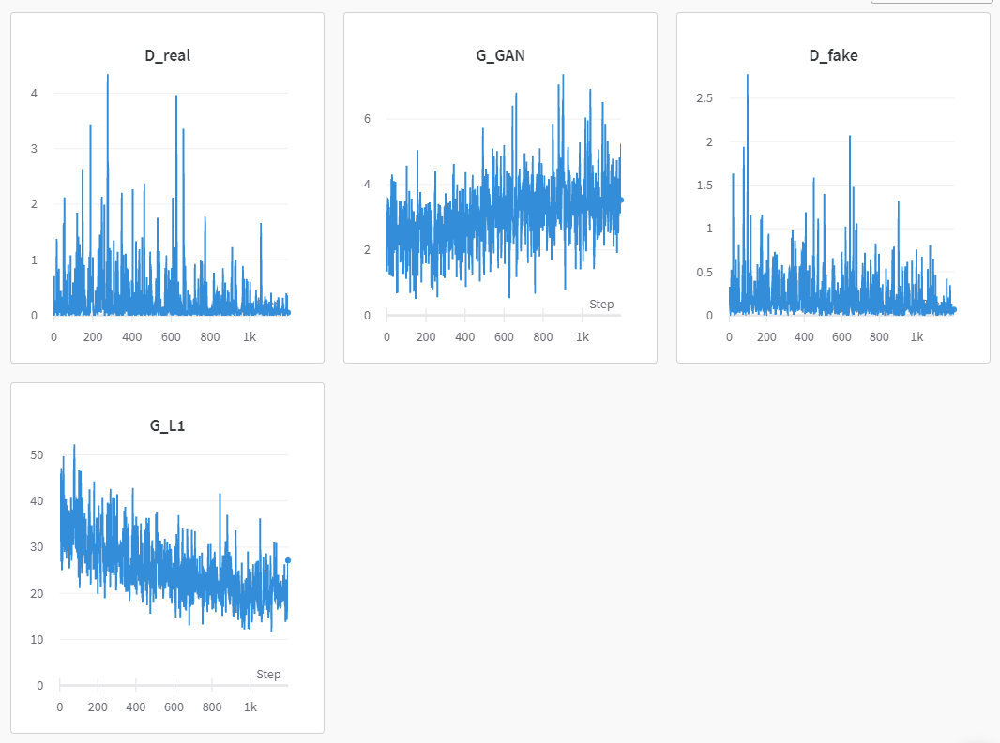

### visualize

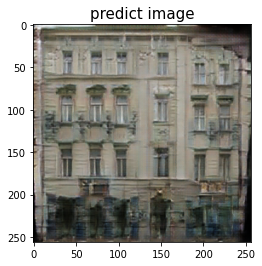

In [11]:
import matplotlib.pyplot as plt

img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_fake_B.png') #predict
plt.title("predict image", fontsize=15)
plt.imshow(img)

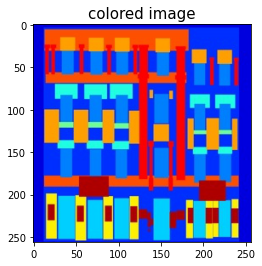

In [12]:
img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_real_A.png') #colored
plt.title("colored image", fontsize=15)
plt.imshow(img)

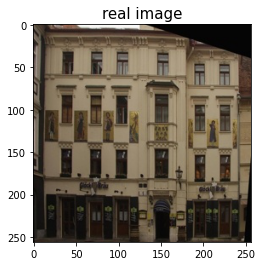

In [13]:
img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_real_B.png') #real
plt.title("real image", fontsize=15)
plt.imshow(img)

### Pretrained model result
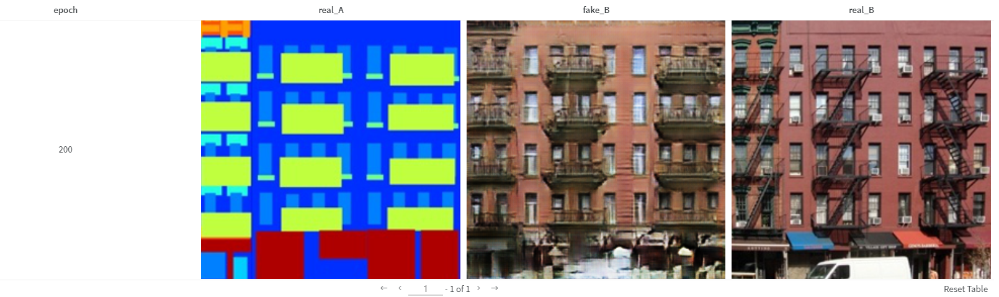

# Discussion 
- epoch 200으로 돌렸을 때 nonpretrain model의 결과는 color segmentation이 되다 만 듯이 나옴 
- pretrained model을 200epoch 으로 돌렸을 때 실제 이미지와 비슷한 이미지 생성됨 
- 다음번엔 custom image를 학습시켜 보고싶다.   

Reference -> [tensorflow pix2pix tutorial](https://www.tensorflow.org/tutorials/generative/pix2pix?hl=ko)